Machine Learning:ML teaches the systems to think and understand like humans by learning from the data

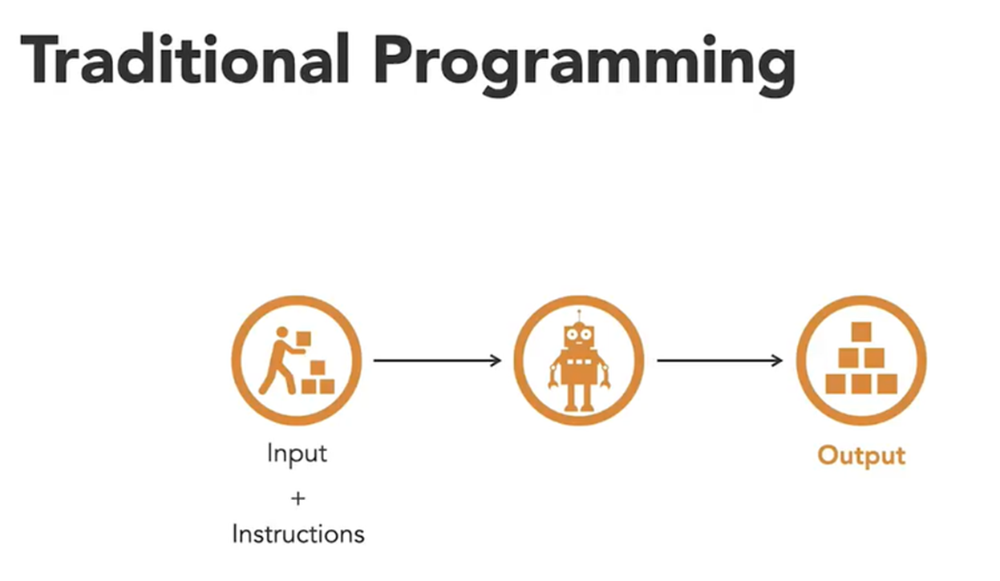

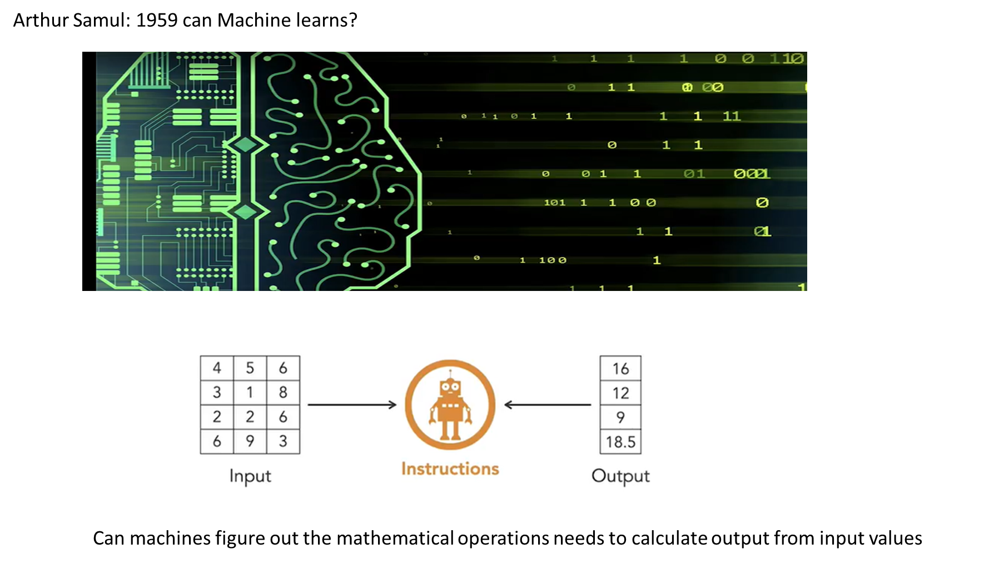

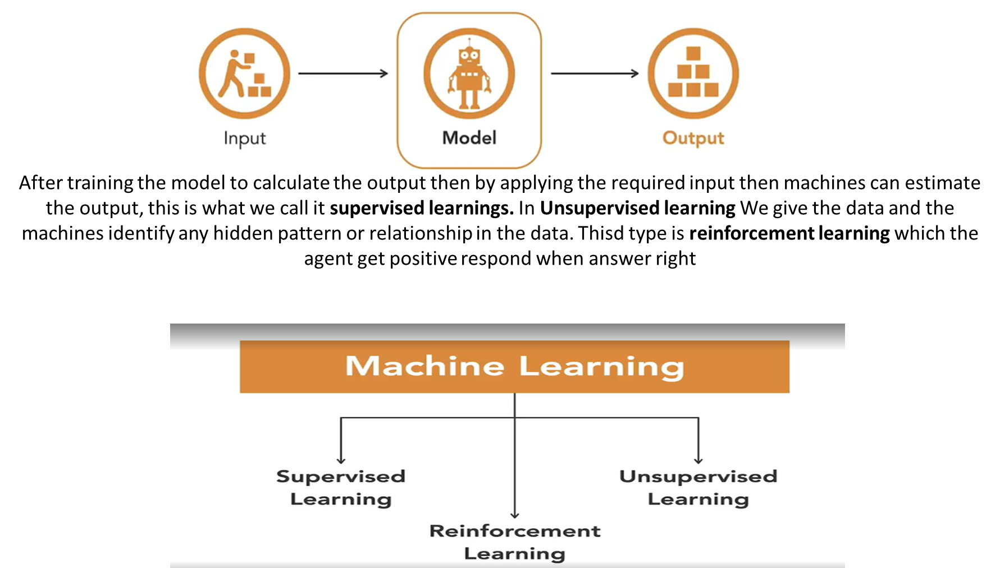

    Supervised Learning: Trains models on labeled data to predict or classify new, unseen data.
    Unsupervised Learning: Finds patterns or groups in unlabeled data, like clustering or dimensionality reduction.
    Reinforcement Learning: Learns through trial and error to maximize rewards, ideal for decision-making tasks.

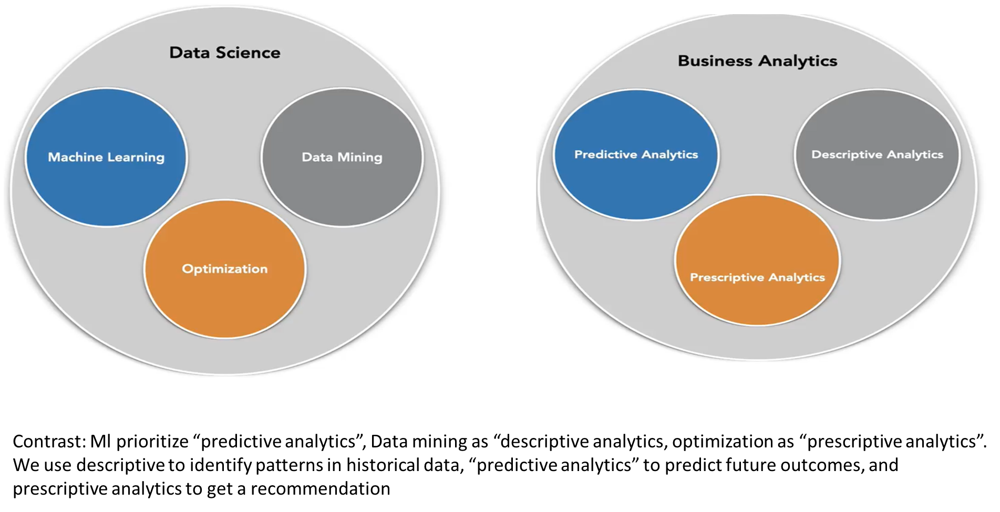

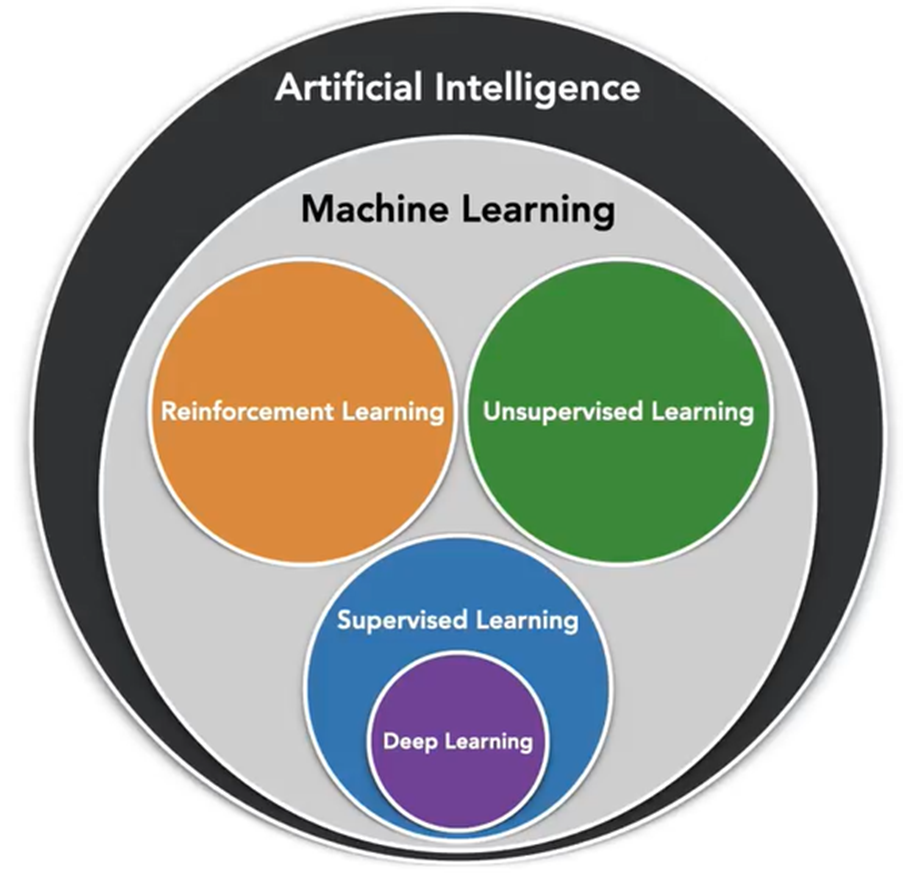

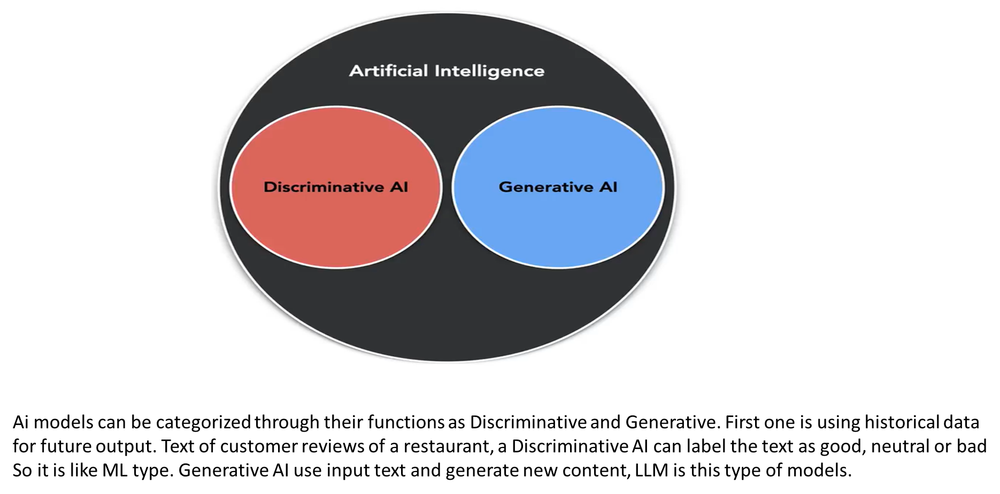

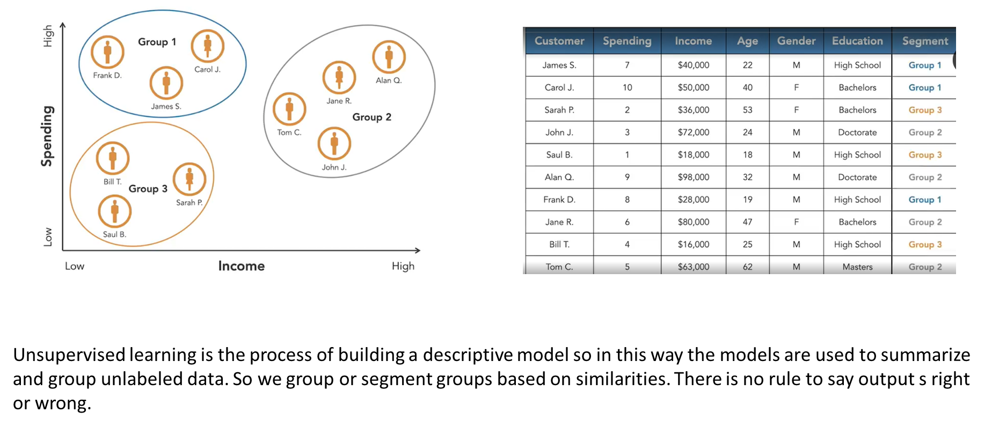

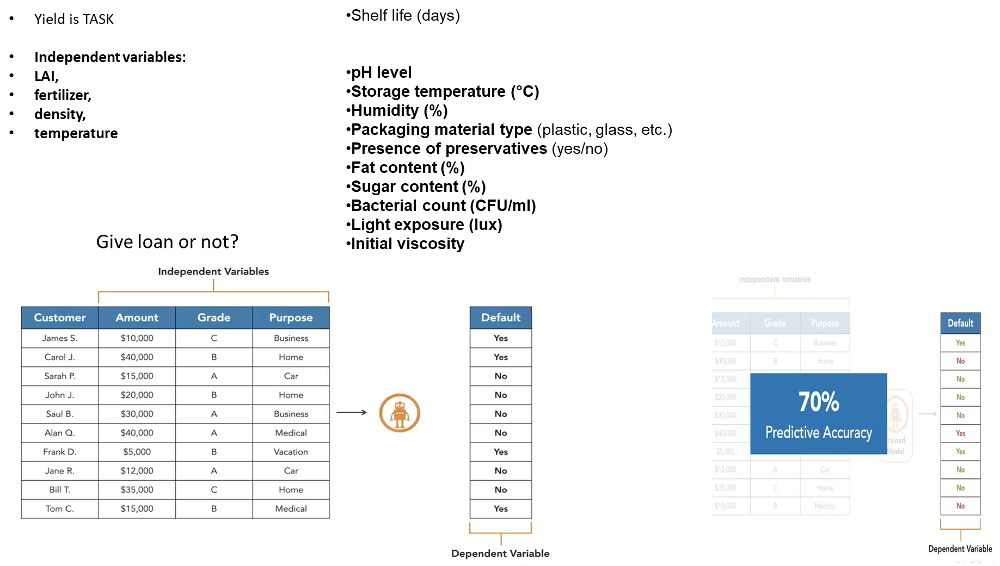

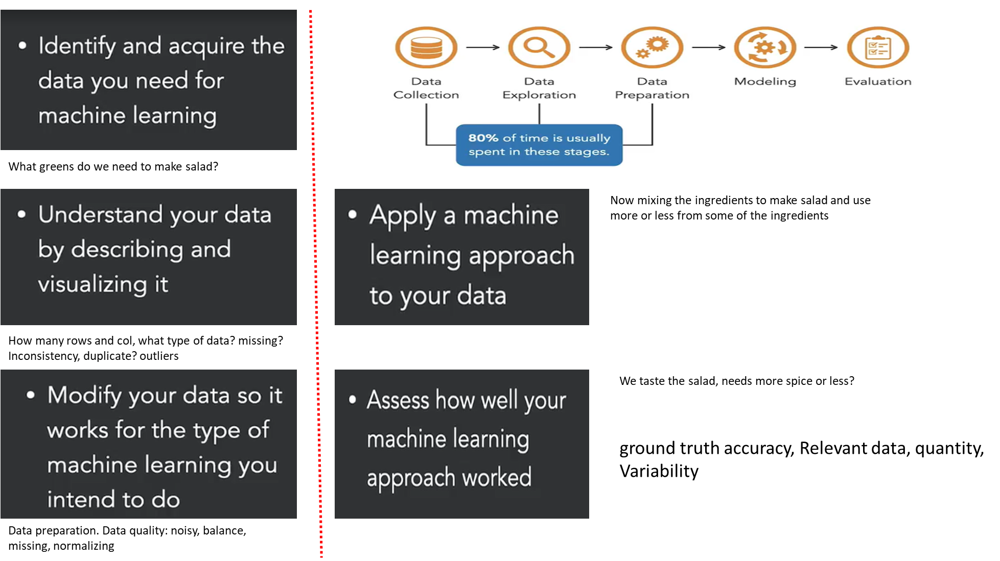

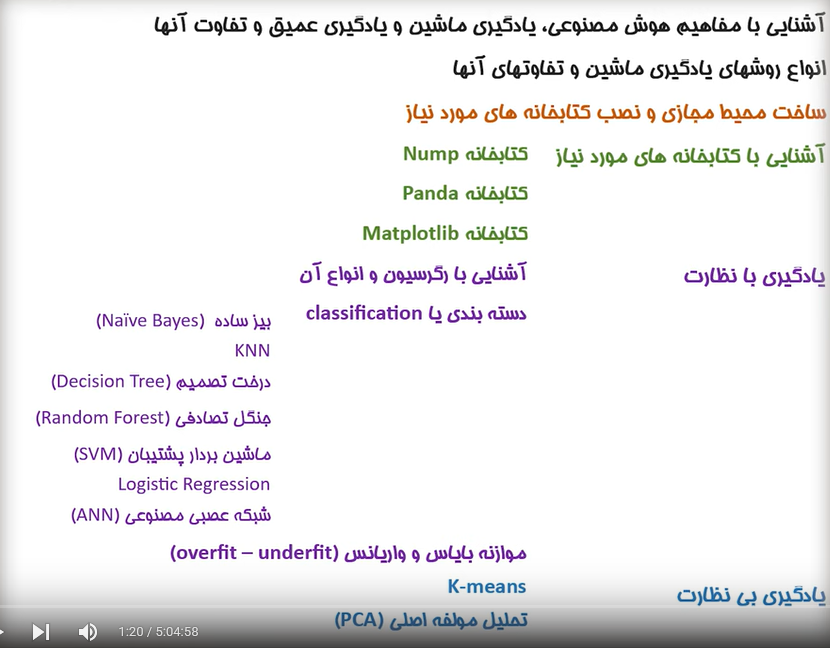

LLM & NLP >>>> Automation stuff using chatbots
NLP (Natural Language Processing) AI
👉 A field of artificial intelligence that focuses on enabling computers to understand, interpret, and generate human language.
Examples: sentiment analysis (positive/negative reviews), translation, chatbots, speech recognition.

LLM (Large Language Model)
👉 A specific type of AI model within NLP that is trained on massive amounts of text data to predict and generate text.
Examples: ChatGPT, GPT-4/5, Bard, LLaMA.

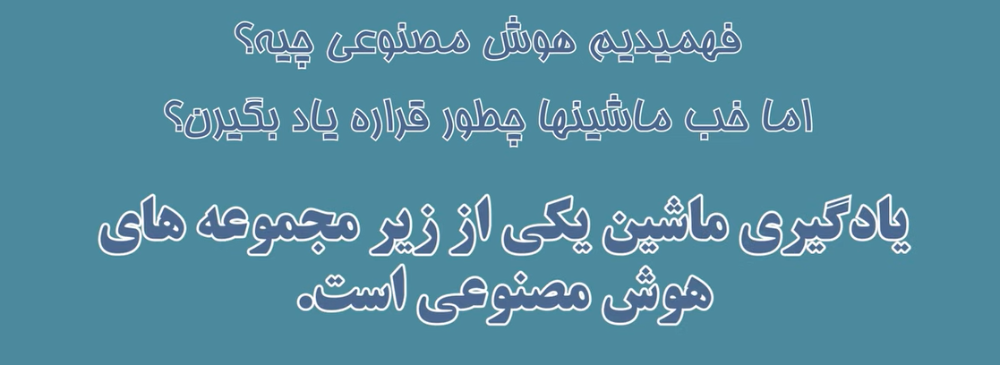

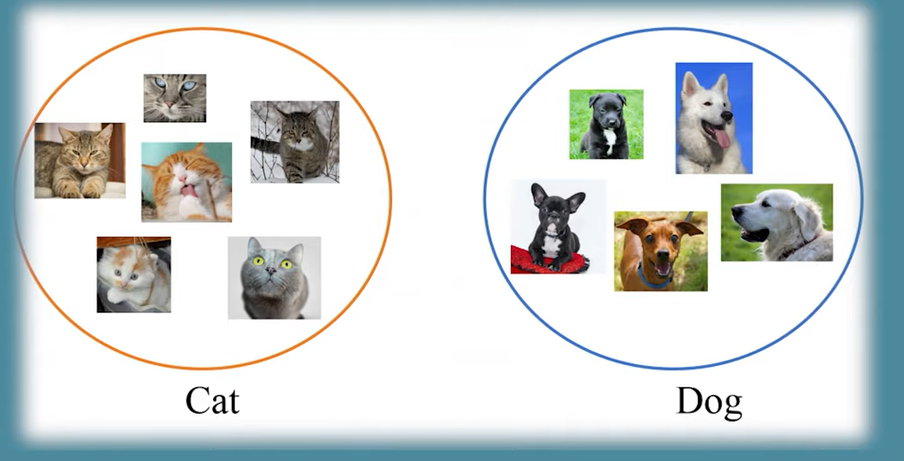

### Deep Learning is based on NN >>> Input, output amd hidden layers

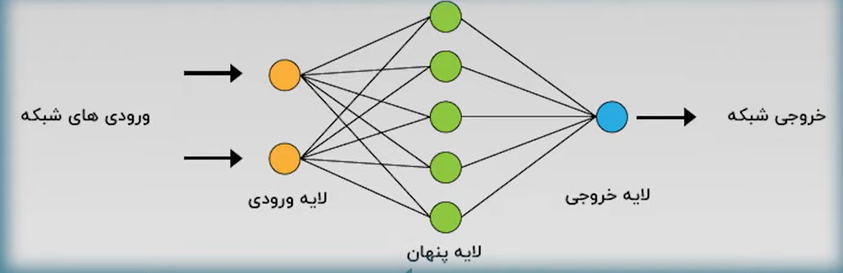

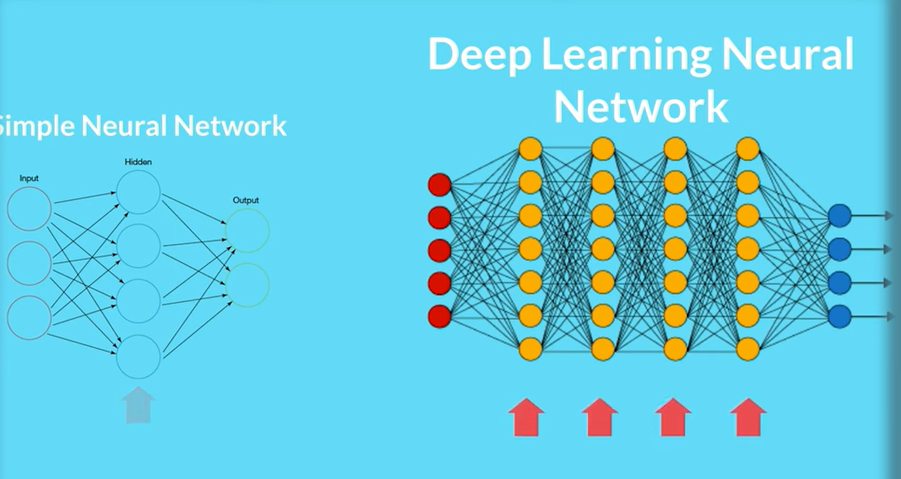

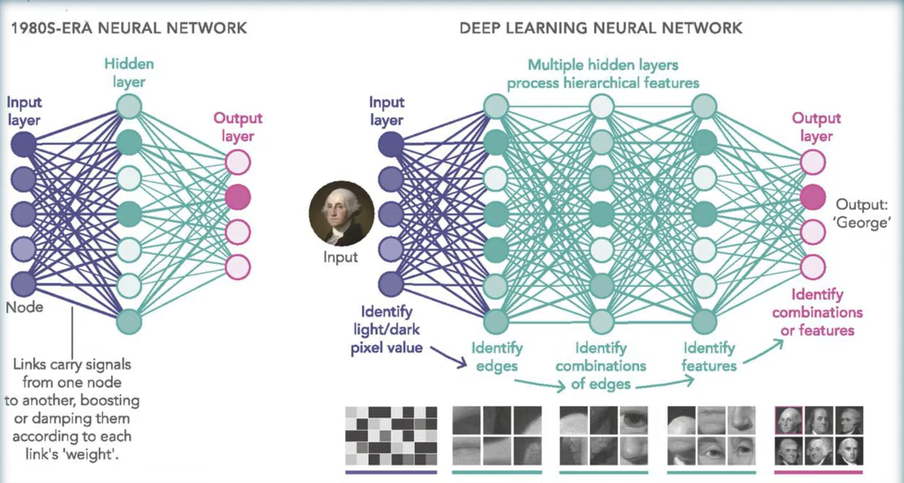

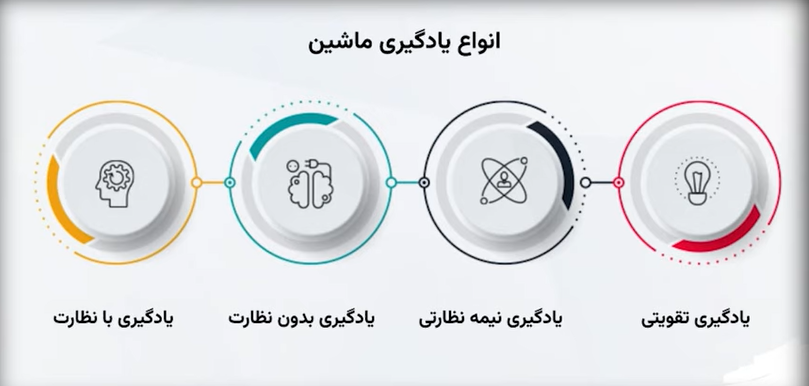

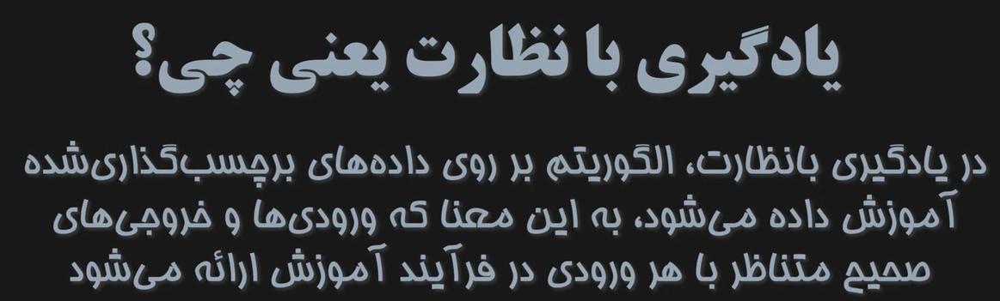

### Regression
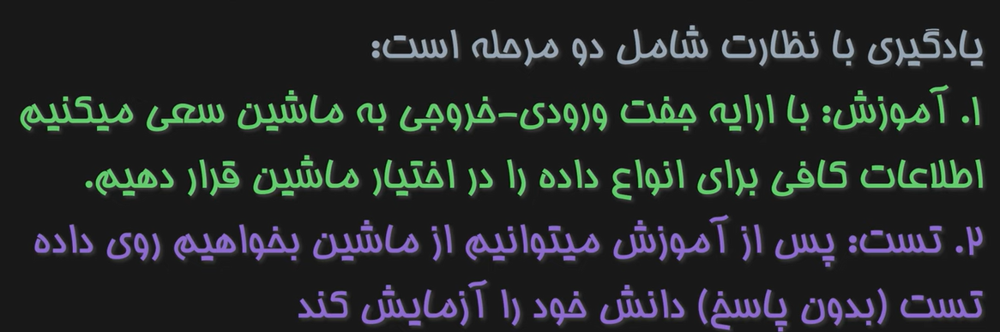

### Classification
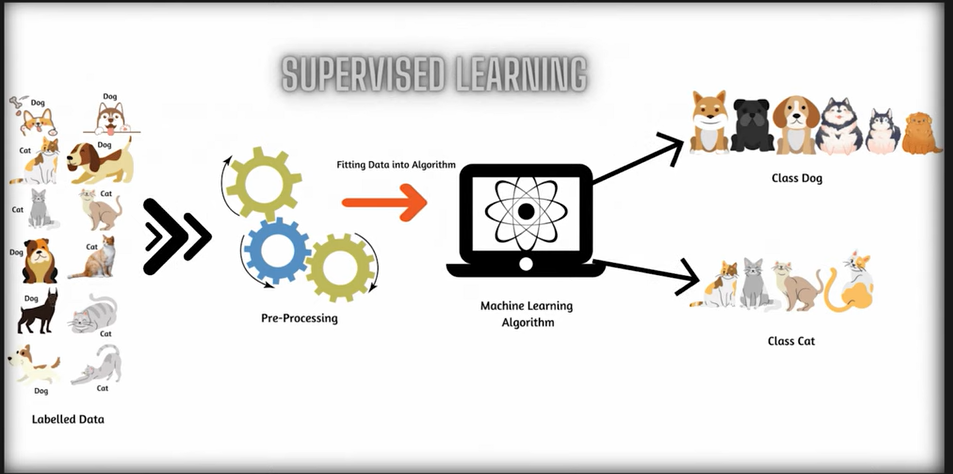

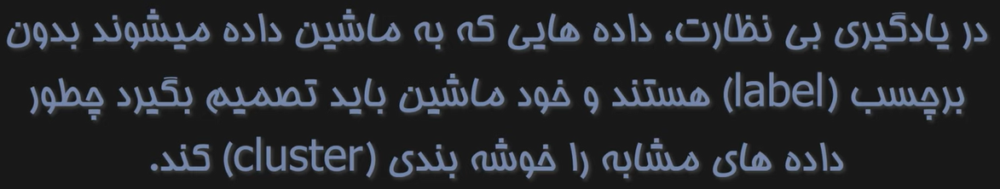

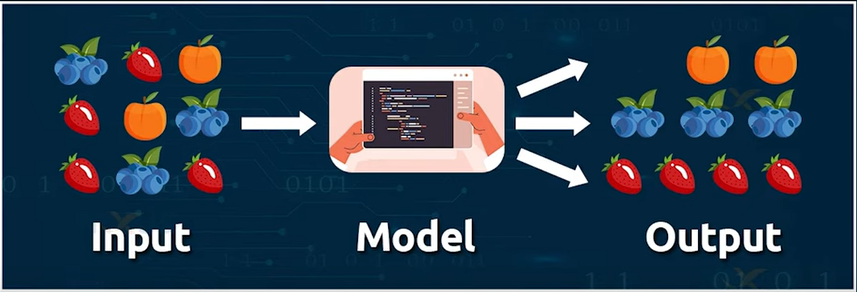

### Data Preprocessing
#### ML Workflow
###### Describe data, summarize data, Data Cleaning

In [1]:
import numpy as np
import pandas as pd

In [2]:
# -------------------------
# Step 1: Generate synthetic dataset
# -------------------------
np.random.seed(42)  # reproducibility

n_samples = 100
feature1 = np.random.randint(18, 60, size=n_samples)       # Age
feature2 = np.random.normal(70, 10, size=n_samples)        # Weight
feature3 = np.random.choice(['Male', 'Female'], n_samples) # Gender
label    = np.random.randint(0, 2, size=n_samples)         # Disease (0 = No, 1 = Yes)

mydf = pd.DataFrame({
    'Age': feature1,
    'Weight': feature2,
    'Gender': feature3,
    'Disease': label
})

In [3]:
mydf.shape

(100, 4)

In [4]:
mydf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Age      100 non-null    int32  
 1   Weight   100 non-null    float64
 2   Gender   100 non-null    object 
 3   Disease  100 non-null    int32  
dtypes: float64(1), int32(2), object(1)
memory usage: 2.5+ KB


In [5]:
mydf.head()

,Age,Weight,Gender,Disease
0,56,68.317949,Female,1
1,46,81.647686,Male,0
2,32,67.542523,Male,1
3,25,62.303322,Male,0
4,38,82.121723,Male,0


In [6]:
mydf.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Age,100.0,37.910000,12.219454,18.000000,26.750000,38.000000,46.250000,59.000000
Weight,100.0,70.083606,9.789660,45.012409,63.792939,69.813179,77.082681,91.587285
Disease,100.0,0.540000,0.500908,0.000000,0.000000,1.000000,1.000000,1.000000


In [7]:
mydf[['Gender']].describe() # 2 [] keeps the result as dataframe but 1 [ keep it as series]

,Gender
count,100
unique,2
top,Female
freq,56


In [8]:
mydf[['Age']].value_counts() # --- How many age groups do we have

Age
41     6
25     5
42     4
32     4
19     4
38     4
56     4
24     4
31     4
43     3
45     3
35     3
46     3
59     3
28     3
53     3
26     3
57     3
21     3
52     3
50     2
58     2
18     2
40     2
34     2
20     2
33     2
39     2
47     1
48     1
36     1
37     1
29     1
27     1
54     1
55     1
23     1
22     1
44     1
51     1
Name: count, dtype: int64

In [9]:
mydf[['Age']].value_counts(normalize = True)#----> give us perecntage

Age
41     0.06
25     0.05
42     0.04
32     0.04
19     0.04
38     0.04
56     0.04
24     0.04
31     0.04
43     0.03
45     0.03
35     0.03
46     0.03
59     0.03
28     0.03
53     0.03
26     0.03
57     0.03
21     0.03
52     0.03
50     0.02
58     0.02
18     0.02
40     0.02
34     0.02
20     0.02
33     0.02
39     0.02
47     0.01
48     0.01
36     0.01
37     0.01
29     0.01
27     0.01
54     0.01
55     0.01
23     0.01
22     0.01
44     0.01
51     0.01
Name: proportion, dtype: float64

In [12]:
# Deal with missing values
# Step 2: Introduce "dirty" data
# -------------------------
mydf.loc[2, 'Age'] = np.nan                 # Missing value
mydf.loc[5, 'Weight'] = np.nan              # Missing value
mydf.loc[7, 'Gender'] = 'Unknown'           # Inconsistent category
mydf.loc[10] = mydf.loc[3]                    # Duplicate row
mydf.loc[15, 'Weight'] = 300                # Outlier

print("Raw dataset with issues:\n", mydf)

Raw dataset with issues:
      Age     Weight  Gender  Disease
0   56.0  68.317949  Female        1
1   46.0  81.647686    Male        0
2    NaN  67.542523    Male        1
3   25.0  62.303322    Male        0
4   38.0  82.121723    Male        0
..   ...        ...     ...      ...
95  59.0  64.775385  Female        1
96  56.0  70.130339  Female        0
97  58.0  73.777696    Male        1
98  45.0  70.628246  Female        1
99  24.0  75.015964    Male        1

[100 rows x 4 columns]


In [13]:
#Finding rows with missing data
mydf.isnull()

,Age,Weight,Gender,Disease
0,False,False,False,False
1,False,False,False,False
2,True,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
95,False,False,False,False
96,False,False,False,False
97,False,False,False,False
98,False,False,False,False


In [14]:
mydf.isnull().sum()

Age        1
Weight     1
Gender     0
Disease    0
dtype: int64

In [15]:
# Imputation

# Step 3: Data Cleaning Examples
# -------------------------

# 1. Handling missing values
mydf['Age'].fillna(mydf['Age'].mean(), inplace=True)    # Replace NaN Age with mean
mydf['Weight'].fillna(mydf['Weight'].median(), inplace=True)  # Replace NaN Weight with median

C:\Users\Mo\AppData\Local\Temp\ipykernel_6668\2992688577.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  mydf['Age'].fillna(mydf['Age'].mean(), inplace=True)    # Replace NaN Age with mean
C:\Users\Mo\AppData\Local\Temp\ipykernel_6668\2992688577.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always 

In [16]:
# 2. Handling inconsistent categories
mydf['Gender'].replace('Unknown', np.nan, inplace=True)  # Treat 'Unknown' as missing
mydf['Gender'].fillna(mydf['Gender'].mode()[0], inplace=True)  # Replace with most frequent

C:\Users\Mo\AppData\Local\Temp\ipykernel_6668\3398267394.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  mydf['Gender'].replace('Unknown', np.nan, inplace=True)  # Treat 'Unknown' as missing
C:\Users\Mo\AppData\Local\Temp\ipykernel_6668\3398267394.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values alway

In [17]:
# 3. Remove duplicates
mydf.drop_duplicates(inplace=True)


In [21]:
# 4. Handling outliers (example: remove weight > 200)
mydf = mydf[mydf['Weight'] < 200]

print("\nCleaned dataset:\n", mydf)


Cleaned dataset:
           Age     Weight  Gender  Disease
0   56.000000  68.317949  Female        1
1   46.000000  81.647686    Male        0
2   37.808081  67.542523    Male        1
3   25.000000  62.303322    Male        0
4   38.000000  82.121723    Male        0
..        ...        ...     ...      ...
95  59.000000  64.775385  Female        1
96  56.000000  70.130339  Female        0
97  58.000000  73.777696    Male        1
98  45.000000  70.628246  Female        1
99  24.000000  75.015964    Male        1

[98 rows x 4 columns]


##### Feature scaling 
##### Standardization (Z-score scaling) → rescales features to mean = 0 and std = 1.
##### Normalization (Min-Max scaling) → rescales features to [0, 1] range.

Normalize data (Data preparation: to make iteasier for ML): Z-score (mean =0, std=1 --->
(x-Mu)/std)


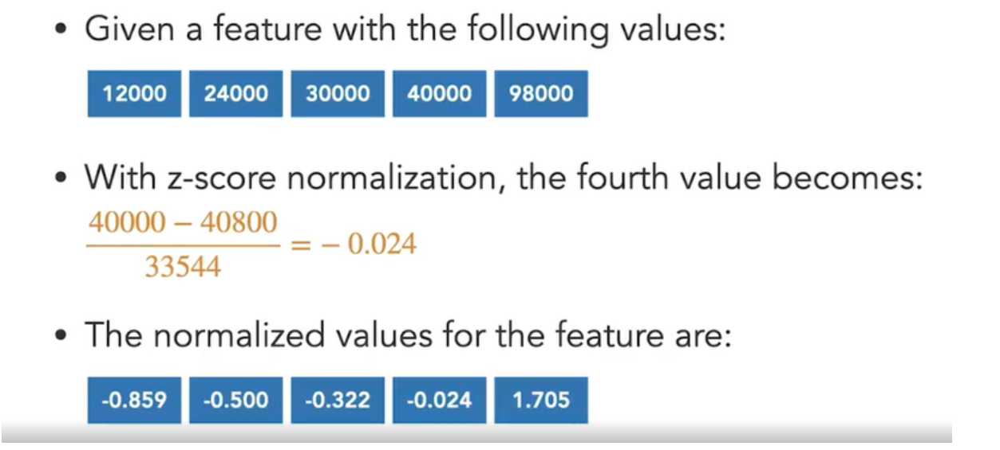

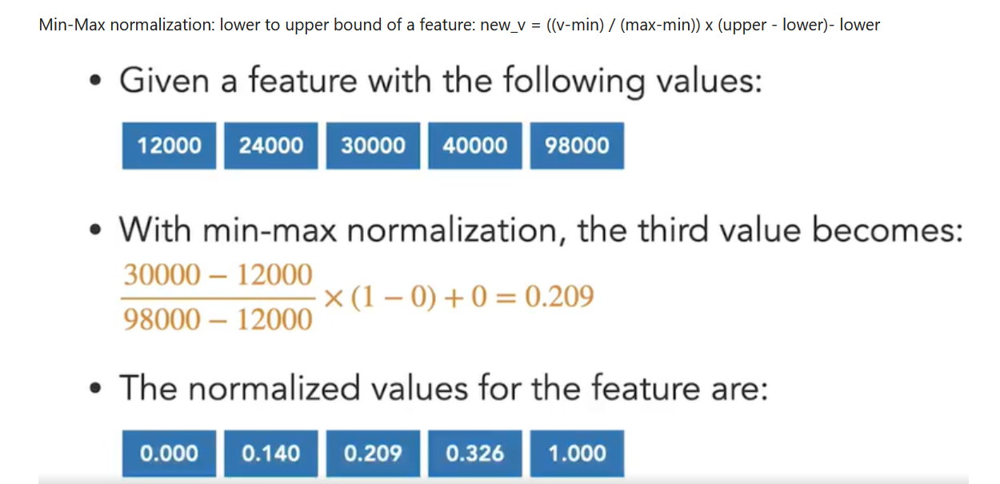

In [22]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# -------------------------
# Step 2: Feature Scaling
# -------------------------

# Select numeric features
X = mydf[['Age', 'Weight']].values

# Standardization (Z-score scaling)
scaler_std = StandardScaler()
X_std = scaler_std.fit_transform(X)

# Normalization (Min-Max scaling)
scaler_mm = MinMaxScaler()
X_mm = scaler_mm.fit_transform(X)

# Put results in DataFrame for comparison
scaled_df = pd.DataFrame({
    'Age': mydf['Age'].values,
    'Weight': mydf['Weight'].values,
    'Age_std': X_std[:, 0],
    'Weight_std': X_std[:, 1],
    'Age_minmax': X_mm[:, 0],
    'Weight_minmax': X_mm[:, 1]
})

print("\nComparison of original vs. scaled features:\n", scaled_df.head())


Comparison of original vs. scaled features:
          Age     Weight   Age_std  Weight_std  Age_minmax  Weight_minmax
0  56.000000  68.317949  1.473857   -0.181644    0.926829       0.500389
1  46.000000  81.647686  0.658372    1.191073    0.682927       0.786589
2  37.808081  67.542523 -0.009666   -0.261499    0.483124       0.483740
3  25.000000  62.303322 -1.054145   -0.801040    0.170732       0.371250
4  38.000000  82.121723  0.005985    1.239890    0.487805       0.796767


##### Feature extraction

In [23]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures, LabelEncoder
from sklearn.feature_selection import VarianceThreshold


In [24]:
# -------------------------
# Step 3: Feature Extraction
# -------------------------

# (a) Encode categorical feature (Gender → numeric)
le = LabelEncoder()
mydf['Gender_encoded'] = le.fit_transform(mydf['Gender'])

# (b) Polynomial features (interaction terms: Age^2, Age*Weight, etc.)
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(mydf[['Age', 'Weight']])
poly_features = poly.get_feature_names_out(['Age', 'Weight'])

df_poly = pd.DataFrame(X_poly, columns=poly_features)
mydf = pd.concat([mydf.reset_index(drop=True), df_poly], axis=1)

# (c) Feature selection: remove features with low variance
selector = VarianceThreshold(threshold=1.0)  # remove features with variance < 1
X_selected = selector.fit_transform(df_poly)
selected_features = df_poly.columns[selector.get_support()]

print("\n🔹 Encoded + Polynomial Features:\n", mydf.head())
print("\n🔹 Features selected (variance > 1):", list(selected_features))


🔹 Encoded + Polynomial Features:
          Age     Weight  Gender  Disease  Gender_encoded        Age  \
0  56.000000  68.317949  Female        1               0  56.000000   
1  46.000000  81.647686    Male        0               1  46.000000   
2  37.808081  67.542523    Male        1               1  37.808081   
3  25.000000  62.303322    Male        0               1  25.000000   
4  38.000000  82.121723    Male        0               1  38.000000   

      Weight        Age^2   Age Weight     Weight^2  
0  68.317949  3136.000000  3825.805151  4667.342172  
1  81.647686  2116.000000  3755.793577  6666.344703  
2  67.542523  1429.450974  2553.653172  4561.992430  
3  62.303322   625.000000  1557.583057  3881.703965  
4  82.121723  1444.000000  3120.625490  6743.977458  

🔹 Features selected (variance > 1): ['Age', 'Weight', 'Age^2', 'Age Weight', 'Weight^2']
